In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Show all rows
pd.set_option('display.max_rows', None)

# Show all columns (if needed)
pd.set_option('display.max_columns', None)

In [2]:
data_df=pd.read_csv('road_accident_dataset.csv')
data_df.head()

,Country,Year,Month,Day of Week,Time of Day,Urban/Rural,Road Type,Weather Conditions,Visibility Level,Number of Vehicles Involved,Speed Limit,Driver Age Group,Driver Gender,Driver Alcohol Level,Driver Fatigue,Vehicle Condition,Pedestrians Involved,Cyclists Involved,Accident Severity,Number of Injuries,Number of Fatalities,Emergency Response Time,Traffic Volume,Road Condition,Accident Cause,Insurance Claims,Medical Cost,Economic Loss,Region,Population Density
0,USA,2002,October,Tuesday,Evening,Rural,Street,Windy,220.414651,1,37,18-25,Male,0.051921,0,Poor,1,2,Moderate,8,2,58.625720,7412.752760,Wet,Weather,4,40499.856982,22072.878502,Europe,3866.273014
1,UK,2014,December,Saturday,Evening,Urban,Street,Windy,168.311358,3,96,18-25,Female,0.234893,1,Poor,1,1,Minor,6,1,58.041380,4458.628820,Snow-covered,Mechanical Failure,3,6486.600073,9534.399441,North America,2333.916224
2,USA,2012,July,Sunday,Afternoon,Urban,Highway,Snowy,341.286506,4,62,41-60,Male,0.142366,0,Moderate,0,0,Moderate,13,4,42.374452,9856.915064,Wet,Speeding,4,29164.412982,58009.145124,South America,4408.889129
3,UK,2017,May,Saturday,Evening,Urban,Main Road,Clear,489.384536,2,78,18-25,Male,0.120815,1,Good,2,0,Minor,6,3,48.554014,4958.646267,Icy,Distracted Driving,3,25797.212566,20907.151302,Australia,2810.822423
4,Canada,2002,July,Tuesday,Afternoon,Rural,Highway,Rainy,348.344850,1,98,41-60,Male,0.155842,1,Poor,0,1,Moderate,13,4,18.318250,3843.191463,Icy,Distracted Driving,8,15605.293921,13584.060759,South America,3883.645634


1. Data Exploration and Preparation

In [3]:
# Check shape of data
data_df.shape

(132000, 30)

In [4]:
# Get metadata
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132000 entries, 0 to 131999
Data columns (total 30 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Country                      132000 non-null  object 
 1   Year                         132000 non-null  int64  
 2   Month                        132000 non-null  object 
 3   Day of Week                  132000 non-null  object 
 4   Time of Day                  132000 non-null  object 
 5   Urban/Rural                  132000 non-null  object 
 6   Road Type                    132000 non-null  object 
 7   Weather Conditions           132000 non-null  object 
 8   Visibility Level             132000 non-null  float64
 9   Number of Vehicles Involved  132000 non-null  int64  
 10  Speed Limit                  132000 non-null  int64  
 11  Driver Age Group             132000 non-null  object 
 12  Driver Gender                132000 non-null  object 
 13 

In [5]:
# Check Missing Values
data_df.isnull().sum()

Country                        0
Year                           0
Month                          0
Day of Week                    0
Time of Day                    0
Urban/Rural                    0
Road Type                      0
Weather Conditions             0
Visibility Level               0
Number of Vehicles Involved    0
Speed Limit                    0
Driver Age Group               0
Driver Gender                  0
Driver Alcohol Level           0
Driver Fatigue                 0
Vehicle Condition              0
Pedestrians Involved           0
Cyclists Involved              0
Accident Severity              0
Number of Injuries             0
Number of Fatalities           0
Emergency Response Time        0
Traffic Volume                 0
Road Condition                 0
Accident Cause                 0
Insurance Claims               0
Medical Cost                   0
Economic Loss                  0
Region                         0
Population Density             0
dtype: int

In [6]:
data_df.describe()

,Year,Visibility Level,Number of Vehicles Involved,Speed Limit,Driver Alcohol Level,Driver Fatigue,Pedestrians Involved,Cyclists Involved,Number of Injuries,Number of Fatalities,Emergency Response Time,Traffic Volume,Insurance Claims,Medical Cost,Economic Loss,Population Density
count,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000,132000.000000
mean,2011.973348,275.038776,2.501227,74.544068,0.125232,0.500576,1.000773,0.998356,9.508205,1.995439,32.491746,5041.929098,4.495621,25198.454901,50437.505615,2506.476223
std,7.198624,129.923625,1.117272,26.001448,0.072225,0.500002,0.816304,0.817764,5.774366,1.412974,15.889537,2860.671611,2.867347,14274.771691,28584.290822,1440.646352
min,2000.000000,50.001928,1.000000,30.000000,0.000002,0.000000,0.000000,0.000000,0.000000,0.000000,5.000177,100.062626,0.000000,500.110090,1000.335085,10.002669
25%,2006.000000,162.338860,2.000000,52.000000,0.062630,0.000000,0.000000,0.000000,5.000000,1.000000,18.732879,2560.601299,2.000000,12836.933596,25692.817343,1258.158299
50%,2012.000000,274.672990,3.000000,74.000000,0.125468,1.000000,1.000000,1.000000,9.000000,2.000000,32.534944,5037.909855,4.000000,25188.202669,50395.499874,2506.203333
75%,2018.000000,388.014111,3.000000,97.000000,0.187876,1.000000,2.000000,2.000000,15.000000,3.000000,46.289527,7524.638162,7.000000,37529.024899,75186.626093,3756.652950
max,2024.000000,499.999646,4.000000,119.000000,0.249999,1.000000,2.000000,2.000000,19.000000,4.000000,59.999588,9999.997468,9.000000,49999.930130,99999.622968,4999.991745


In [7]:
#check for duplicates
data_df.duplicated().sum()

np.int64(0)

Key Insights
- data has 1320000 entries and 30 columns
- no apparent null values
- no duplicated entries in the dataset

Change Datatypes

In [8]:
#drivers fatigu faeture is a boolean type

data_df['Driver Fatigue']=data_df['Driver Fatigue'].astype(bool)

#year as object
data_df['Year']=data_df['Year'].astype('object')

Feature Engineering
- convert the month and year column into datetime format


In [9]:
print(data_df[['Year','Month']])

        Year      Month
0       2002    October
1       2014   December
2       2012       July
3       2017        May
4       2002       July
5       2010        May
6       2010      March
7       2016       July
8       2014     August
9       2007      April
10      2017       July
11      2014  September
12      2005    January
13      2008  September
14      2013        May
15      2001     August
16      2010    October
17      2017     August
18      2002        May
19      2009       July
20      2013      April
21      2004   December
22      2020    October
23      2008    January
24      2010   February
25      2023    October
26      2007       June
27      2024   November
28      2008      April
29      2014    October
30      2021        May
31      2009   November
32      2002     August
33      2004      April
34      2005       June
35      2018      March
36      2009      April
37      2020   February
38      2016      March
39      2018      April
40      2006   N

In [10]:
data_df['Date']=pd.to_datetime(data_df['Month'].astype('str') + '-' + data_df['Year'].astype('str'), format='%B-%Y')

In [11]:
data_df['Date']

0        2002-10-01
1        2014-12-01
2        2012-07-01
3        2017-05-01
4        2002-07-01
5        2010-05-01
6        2010-03-01
7        2016-07-01
8        2014-08-01
9        2007-04-01
10       2017-07-01
11       2014-09-01
12       2005-01-01
13       2008-09-01
14       2013-05-01
15       2001-08-01
16       2010-10-01
17       2017-08-01
18       2002-05-01
19       2009-07-01
20       2013-04-01
21       2004-12-01
22       2020-10-01
23       2008-01-01
24       2010-02-01
25       2023-10-01
26       2007-06-01
27       2024-11-01
28       2008-04-01
29       2014-10-01
30       2021-05-01
31       2009-11-01
32       2002-08-01
33       2004-04-01
34       2005-06-01
35       2018-03-01
36       2009-04-01
37       2020-02-01
38       2016-03-01
39       2018-04-01
40       2006-11-01
41       2013-10-01
42       2020-05-01
43       2008-02-01
44       2004-04-01
45       2024-12-01
46       2004-07-01
47       2021-05-01
48       2022-09-01
49       2003-11-01


In [12]:
data_df.columns=data_df.columns.str.lower()

In [13]:
data_df.columns

Index(['country', 'year', 'month', 'day of week', 'time of day', 'urban/rural',
       'road type', 'weather conditions', 'visibility level',
       'number of vehicles involved', 'speed limit', 'driver age group',
       'driver gender', 'driver alcohol level', 'driver fatigue',
       'vehicle condition', 'pedestrians involved', 'cyclists involved',
       'accident severity', 'number of injuries', 'number of fatalities',
       'emergency response time', 'traffic volume', 'road condition',
       'accident cause', 'insurance claims', 'medical cost', 'economic loss',
       'region', 'population density', 'date'],
      dtype='object')

High level Overview

- Descrptive statistics for numerical variables!

In [14]:
num_variables=[i for i in data_df.columns if data_df[i].dtype in ['int', 'float']]

print(num_variables)

['visibility level', 'number of vehicles involved', 'speed limit', 'driver alcohol level', 'pedestrians involved', 'cyclists involved', 'number of injuries', 'number of fatalities', 'emergency response time', 'traffic volume', 'insurance claims', 'medical cost', 'economic loss', 'population density']


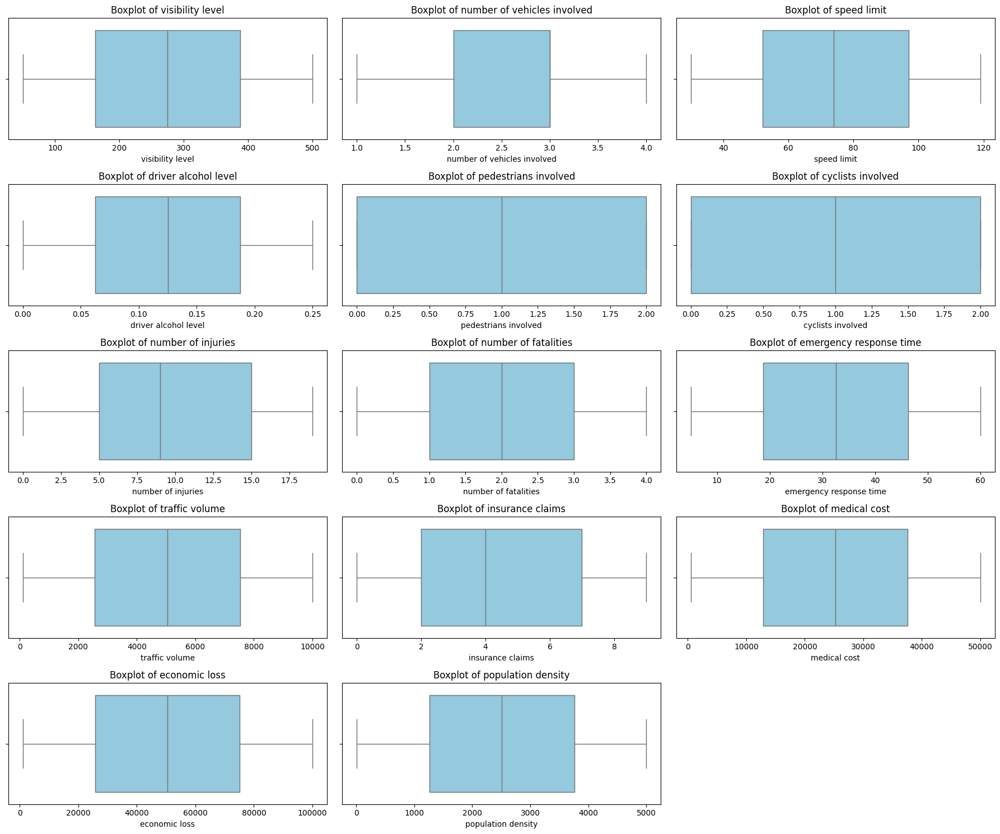

In [15]:
# outlier detection: Box plot of numeric variables

ncols=3
nrow=len(num_variables)//ncols + (len(num_variables)%ncols >0)

plt.figure(figsize=(ncols* 6, nrow*3))

for i,j in enumerate(num_variables):
    plt.subplot(nrow,ncols,i+1)
    sns.boxplot(x=data_df[j],color='skyblue')

    plt.title(f"Boxplot of {j}")

plt.tight_layout()
plt.show()    

Categorical and Boolean Variables

- How do categorical variables correlate with each other in the dataset?

In [16]:
cat_variable=[i for i in data_df.columns if data_df[i].dtype in ['object','bool'] ]
print(cat_variable)

['country', 'year', 'month', 'day of week', 'time of day', 'urban/rural', 'road type', 'weather conditions', 'driver age group', 'driver gender', 'driver fatigue', 'vehicle condition', 'accident severity', 'road condition', 'accident cause', 'region']


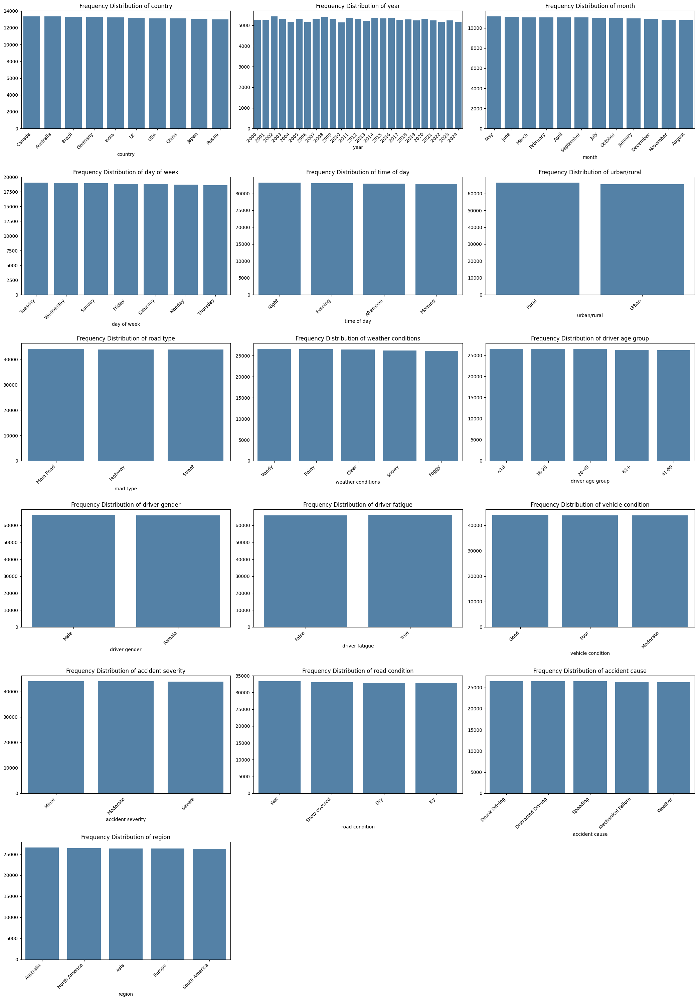

In [17]:
#frequency distribution of accidents :barplots

ncols= 3
nrows= len(cat_variable)//ncols + (len(cat_variable) % ncols >0) 

plt.figure(figsize=(ncols*7,nrows*5 ))

for i, j in enumerate(cat_variable):
    bar_data=data_df[j].value_counts()

    plt.subplot(nrows,ncols,i+1)
    sns.barplot(x=bar_data.index,y=bar_data.values,color='steelblue')
    plt.xticks(rotation=45,ha='right')
    plt.title(f"Frequency Distribution of {j}")

plt.tight_layout()    
plt.show()



Correlation

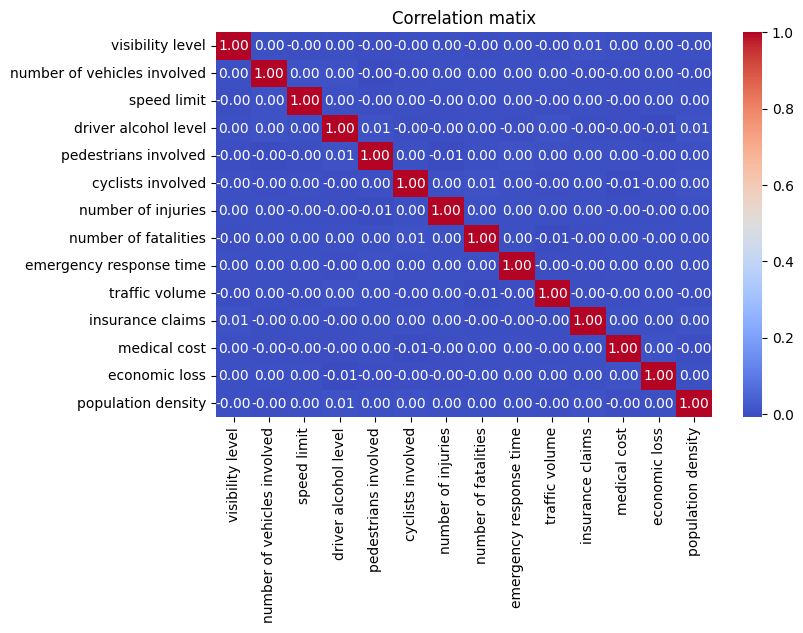

,visibility level,number of vehicles involved,speed limit,driver alcohol level,pedestrians involved,cyclists involved,number of injuries,number of fatalities,emergency response time,traffic volume,insurance claims,medical cost,economic loss,population density
visibility level,1.000000,0.000461,-0.002504,0.002469,-0.003712,-0.000416,0.000960,-0.000637,0.001501,-0.002471,0.005050,0.001066,0.002969,-0.000137
number of vehicles involved,0.000461,1.000000,0.003759,0.003767,-0.004993,-0.001884,0.002234,0.003353,0.001926,0.003168,-0.003621,-0.001092,0.000377,-0.004312
speed limit,-0.002504,0.003759,1.000000,0.000760,-0.001365,0.001922,-0.001118,0.000621,0.000189,-0.001970,0.000065,-0.001014,0.000349,0.001393
driver alcohol level,0.002469,0.003767,0.000760,1.000000,0.005053,-0.000792,-0.001200,0.002115,-0.001453,0.003478,-0.004082,-0.001981,-0.005284,0.005116
pedestrians involved,-0.003712,-0.004993,-0.001365,0.005053,1.000000,0.002873,-0.008377,0.003346,0.004827,0.001052,0.001225,0.001900,-0.000812,0.000973
cyclists involved,-0.000416,-0.001884,0.001922,-0.000792,0.002873,1.000000,0.000406,0.005160,0.000356,-0.001033,0.000451,-0.005207,-0.002288,0.003785
number of injuries,0.000960,0.002234,-0.001118,-0.001200,-0.008377,0.000406,1.000000,0.000389,0.000222,0.000243,0.003242,-0.003123,-0.001570,0.002038
number of fatalities,-0.000637,0.003353,0.000621,0.002115,0.003346,0.005160,0.000389,1.000000,0.003322,-0.005178,-0.003330,0.001990,-0.000185,0.003267
emergency response time,0.001501,0.001926,0.000189,-0.001453,0.004827,0.000356,0.000222,0.003322,1.000000,-0.001661,-0.003526,0.000392,0.000357,0.001627
traffic volume,-0.002471,0.003168,-0.001970,0.003478,0.001052,-0.001033,0.000243,-0.005178,-0.001661,1.000000,-0.001543,-0.001800,0.001227,-0.001889


In [18]:
num_variables = [i for i in data_df.columns if data_df[i].dtype in ['int64', 'float64']]

# Compute correlation matrix for numeric columns
cor_matrix = data_df[num_variables].corr()

plt.figure(figsize=(8,5))

sns.heatmap(cor_matrix,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Correlation matix')
plt.show()

cor_matrix

- No single feature strongly influences another.
- Low correlation suggests a complex relationship between accident factors.
- This dataset may require non-linear models (Random Forest, XGBoost, Neural Networks) instead of simple linear models.


 Analyze the Impact of Driver Alcohol Level on Accident Severity

In [19]:
data_df.columns

Index(['country', 'year', 'month', 'day of week', 'time of day', 'urban/rural',
       'road type', 'weather conditions', 'visibility level',
       'number of vehicles involved', 'speed limit', 'driver age group',
       'driver gender', 'driver alcohol level', 'driver fatigue',
       'vehicle condition', 'pedestrians involved', 'cyclists involved',
       'accident severity', 'number of injuries', 'number of fatalities',
       'emergency response time', 'traffic volume', 'road condition',
       'accident cause', 'insurance claims', 'medical cost', 'economic loss',
       'region', 'population density', 'date'],
      dtype='object')

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_4020\3918818074.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='driver alcohol level',y='accident severity',data=data_df,palette='Set2')


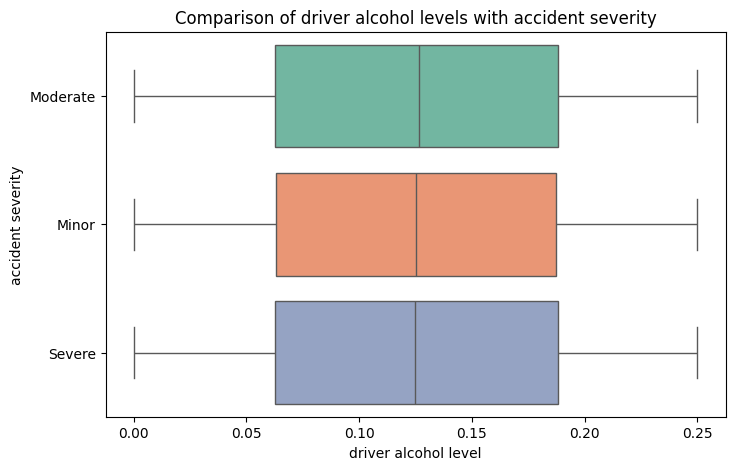

In [20]:
# columns=data_df[['driver alcohol level','accident severity']]

plt.figure(figsize=(8,5))

sns.boxplot(x='driver alcohol level',y='accident severity',data=data_df,palette='Set2')
plt.xlabel('driver alcohol level')
plt.ylabel('accident severity')
plt.title('Comparison of driver alcohol levels with accident severity')
plt.show()


Driver alcohol level alone may not be a strong predictor of accident severity in this dataset.

Driver Fatigue vs. Accident Severity!

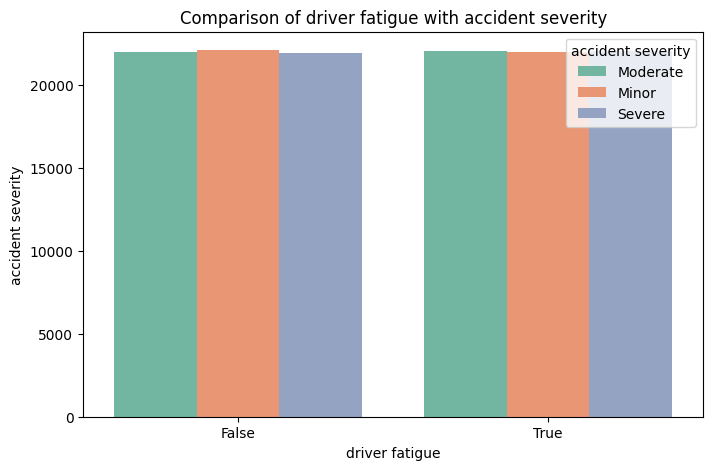

In [22]:
plt.figure(figsize=(8,5))

sns.countplot(x='driver fatigue',hue='accident severity',data=data_df,palette='Set2')
plt.xlabel('driver fatigue')
plt.ylabel('accident severity')
plt.title('Comparison of driver fatigue with accident severity')
plt.show()

Fatigue alone may not be a strong predictor of accident severity in this dataset.

Speed Limit vs. Accident Severity!

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_4020\2270282913.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='speed limit',y='accident severity',data=data_df,palette='Set2')


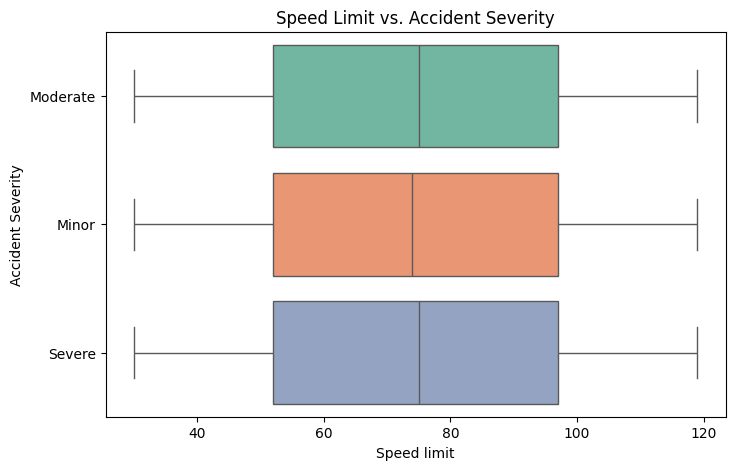

In [25]:
plt.figure(figsize=(8,5))

sns.boxplot(x='speed limit',y='accident severity',data=data_df,palette='Set2')
plt.xlabel('Speed limit')
plt.ylabel('Accident Severity')
plt.title('Speed Limit vs. Accident Severity')
plt.show()

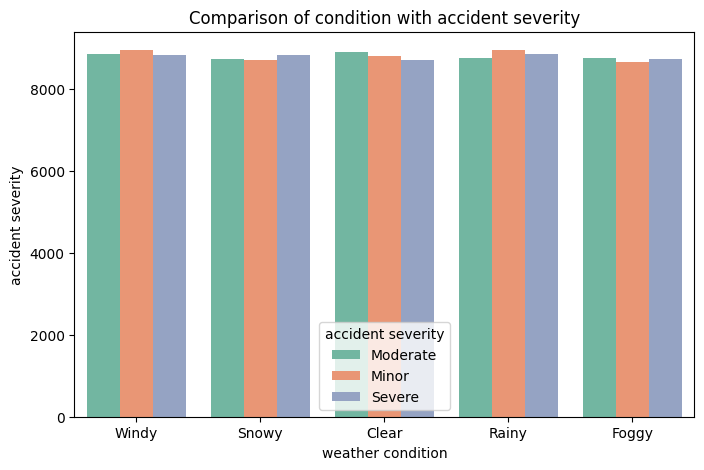

In [27]:
plt.figure(figsize=(8,5))

sns.countplot(x='weather conditions',hue='accident severity',data=data_df,palette='Set2')
plt.xlabel('weather condition')
plt.ylabel('accident severity')
plt.title('Comparison of condition with accident severity')
plt.show()

 Economic Loss vs. Accident Severity!

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_4020\2903728314.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='economic loss',y='accident severity',data=data_df,palette='Set2')


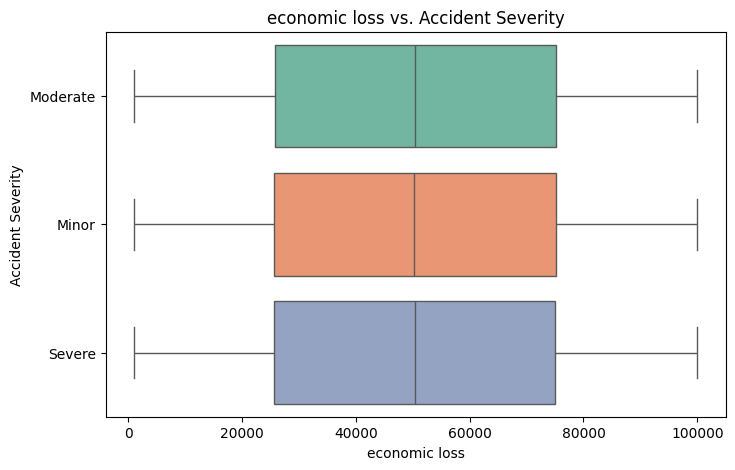

In [28]:
plt.figure(figsize=(8,5))

sns.boxplot(x='economic loss',y='accident severity',data=data_df,palette='Set2')
plt.xlabel('economic loss')
plt.ylabel('Accident Severity')
plt.title('economic loss vs. Accident Severity')
plt.show()

Number of fatilies and accident severity!

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_4020\2611547013.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='number of fatalities',y='accident severity',data=data_df,palette='Set2')


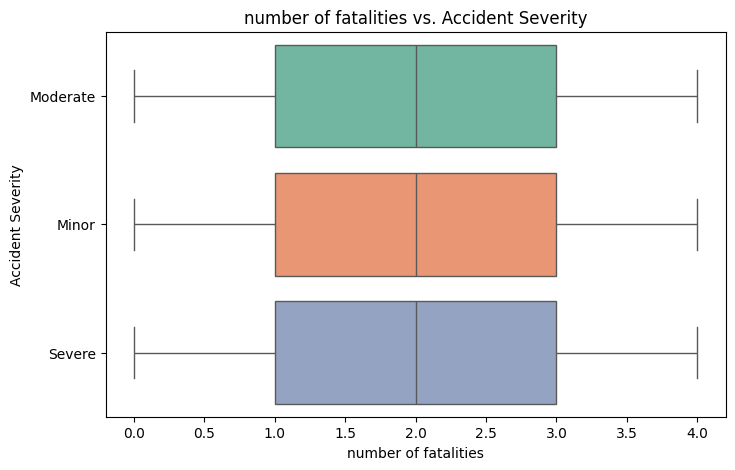

In [29]:
plt.figure(figsize=(8,5))

sns.boxplot(x='number of fatalities',y='accident severity',data=data_df,palette='Set2')
plt.xlabel('number of fatalities')
plt.ylabel('Accident Severity')
plt.title('number of fatalities vs. Accident Severity')
plt.show()

In [30]:
data_df.columns

Index(['country', 'year', 'month', 'day of week', 'time of day', 'urban/rural',
       'road type', 'weather conditions', 'visibility level',
       'number of vehicles involved', 'speed limit', 'driver age group',
       'driver gender', 'driver alcohol level', 'driver fatigue',
       'vehicle condition', 'pedestrians involved', 'cyclists involved',
       'accident severity', 'number of injuries', 'number of fatalities',
       'emergency response time', 'traffic volume', 'road condition',
       'accident cause', 'insurance claims', 'medical cost', 'economic loss',
       'region', 'population density', 'date'],
      dtype='object')

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_4020\2589432787.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='number of vehicles involved',y='accident severity',data=data_df,palette='Set2')


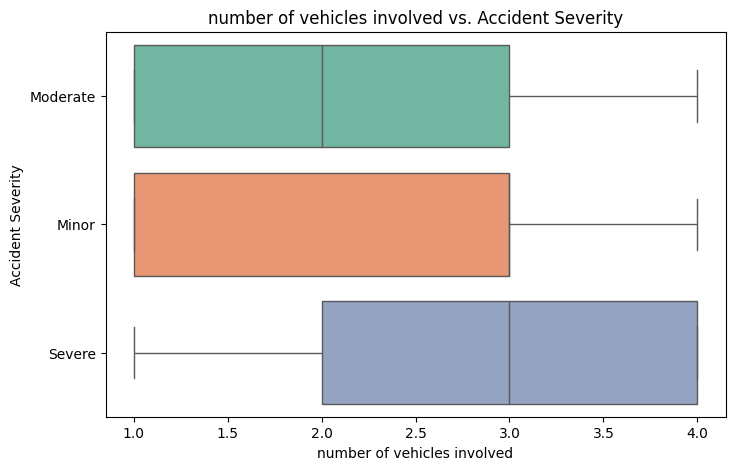

In [32]:
plt.figure(figsize=(8,5))
sns.boxplot(x='number of vehicles involved',y='accident severity',data=data_df,palette='Set2')
plt.xlabel('number of vehicles involved')
plt.ylabel('Accident Severity')
plt.title('number of vehicles involved vs. Accident Severity')
plt.show()


Key Observations

1️⃣ Severe Accidents Tend to Involve More Vehicles

The median number of vehicles is higher in severe accidents compared to minor and moderate ones.

This suggests that multi-vehicle collisions are more likely to result in severe accidents.

2️⃣ Minor and Moderate Accidents Have a Lower Number of Vehicles Involved

Most minor accidents involve fewer vehicles, likely single-vehicle or two-vehicle collisions.

Moderate accidents also have a similar pattern, with a slightly higher range compared to minor ones.

3️⃣ Higher Variability in Severe Accidents

The spread is larger for severe accidents, indicating that some severe accidents involve many vehicles.

This could mean that pile-ups, chain reactions, or highway crashes are more severe.


What This Means
- Accidents with more vehicles involved are generally more severe.
- Single-vehicle crashes tend to be minor, while multi-vehicle crashes are more dangerous.
- Traffic density, road design, and driving behavior could influence multi-vehicle crashes.


In [38]:
data_df['road condition'].dtype

dtype('O')

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_4020\2942568882.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='traffic volume',y='accident severity',data=data_df,palette='Set2')


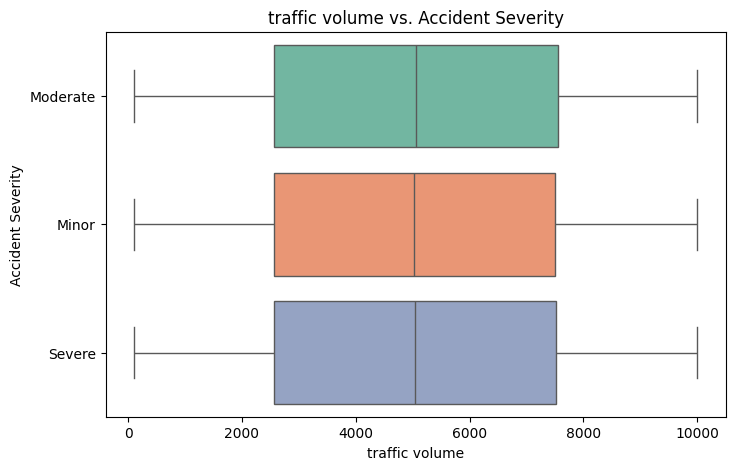

In [35]:
plt.figure(figsize=(8,5))
sns.boxplot(x='traffic volume',y='accident severity',data=data_df,palette='Set2')
plt.xlabel('traffic volume')
plt.ylabel('Accident Severity')
plt.title('traffic volume vs. Accident Severity')
plt.show()

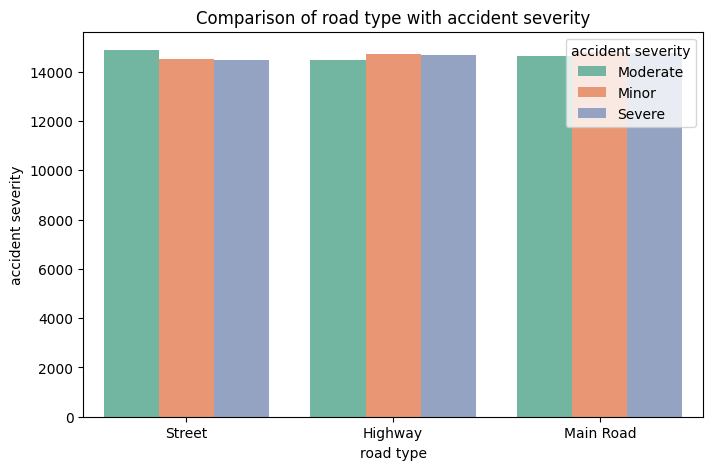

In [37]:
plt.figure(figsize=(8,5))

sns.countplot(x='road type',hue='accident severity',data=data_df,palette='Set2')
plt.xlabel('road type')
plt.ylabel('accident severity')
plt.title('Comparison of road type with accident severity')
plt.show()

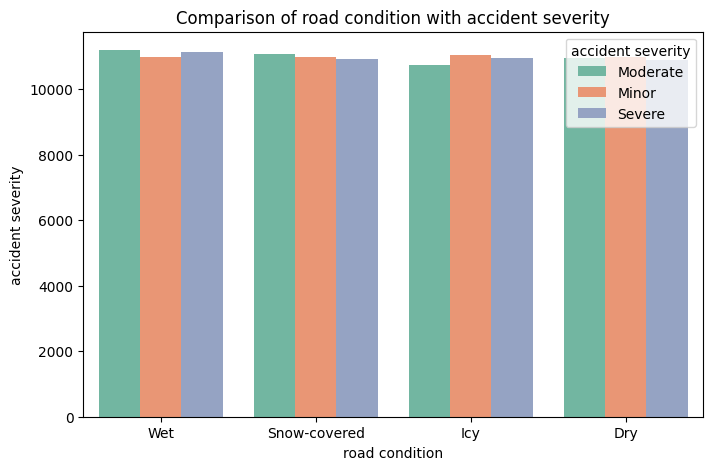

In [39]:
plt.figure(figsize=(8,5))

sns.countplot(x='road condition',hue='accident severity',data=data_df,palette='Set2')
plt.xlabel('road condition')
plt.ylabel('accident severity')
plt.title('Comparison of road condition with accident severity')
plt.show()


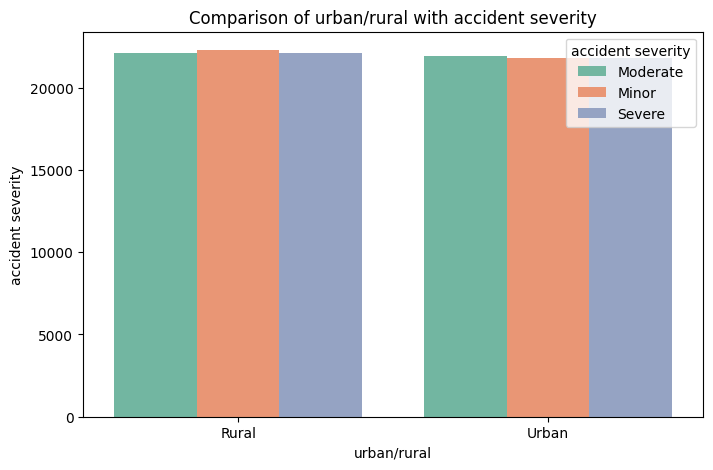

In [40]:
plt.figure(figsize=(8,5))

sns.countplot(x='urban/rural',hue='accident severity',data=data_df,palette='Set2')
plt.xlabel('urban/rural')
plt.ylabel('accident severity')
plt.title('Comparison of urban/rural with accident severity')
plt.show()

Label Encoding

In [48]:
from sklearn.preprocessing import LabelEncoder

cat_variables=[i for i in data_df.columns if data_df[i].dtype in ['object','bool']]

le=LabelEncoder()
for i in data_df.columns:
   data_df[i]=le.fit_transform(data_df[i])

print(data_df.head())   


   country  year  month  day of week  time of day  urban/rural  road type  \
0        9     2     10            5            1            0          2   
1        8    14      2            2            1            1          2   
2        9    12      5            3            0            1          0   
3        8    17      8            2            1            1          1   
4        2     2      5            5            0            0          0   

   weather conditions  visibility level  number of vehicles involved  \
0                   4             50090                            0   
1                   4             34739                            2   
2                   3             85434                            3   
3                   0            128921                            1   
4                   2             87563                            0   

   speed limit  driver age group  driver gender  driver alcohol level  \
0            7                 

In [49]:
data_df.shape

(132000, 31)

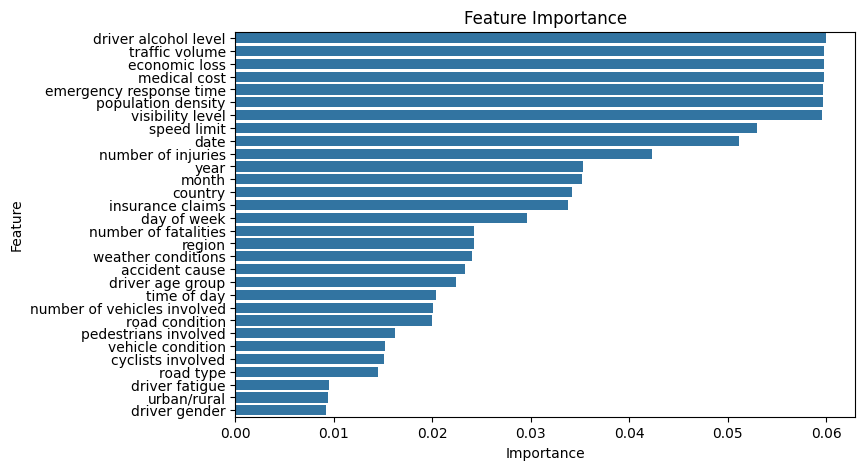

In [52]:
from sklearn.ensemble import RandomForestClassifier

x=data_df.drop(columns=['accident severity'])
y=data_df['accident severity']

model=RandomForestClassifier()
model.fit(x,y)

feature_importance=pd.DataFrame({'Feature':x.columns,'Importance':model.feature_importances_})
feature_importance=feature_importance.sort_values(by='Importance',ascending=False)

plt.figure(figsize=(8,5))

sns.barplot(x=feature_importance['Importance'],y=feature_importance['Feature'])
plt.title('Feature Importance')
plt.show()

Split the dataset into train and test sets

In [53]:
from sklearn.model_selection import train_test_split

x=data_df.drop(columns=['accident severity'])
y=data_df['accident severity']

X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

X_train.shape,y_train.shape,X_test.shape,y_train.shape


((105600, 30), (105600,), (26400, 30), (105600,))

In [55]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

model=RandomForestClassifier()
model.fit(X_train,y_train)

y_pred=model.predict(X_test)

report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.33      0.36      0.35      8751
           1       0.34      0.34      0.34      8767
           2       0.34      0.31      0.32      8882

    accuracy                           0.34     26400
   macro avg       0.34      0.34      0.34     26400
weighted avg       0.34      0.34      0.34     26400



The model is not performing well
 we will perform diffrent methods make the models performance better

1: Feature Selection
2: Hyperparameter Tuning
3: use complex model

Drop Low importnace feature

In [56]:
low_importnace_features=['driver gender', 'urban/rural', 'driver fatigue', 'road type','cyclists involved', 'vehicle condition']

X_train_selected=X_train.drop(columns=low_importnace_features)
X_test_selected=X_test.drop(columns=low_importnace_features)


In [57]:
model=RandomForestClassifier()
model.fit(X_train_selected,y_train)

y_pred=model.predict(X_test_selected)

report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.33      0.36      0.34      8751
           1       0.33      0.34      0.34      8767
           2       0.33      0.30      0.32      8882

    accuracy                           0.33     26400
   macro avg       0.33      0.33      0.33     26400
weighted avg       0.33      0.33      0.33     26400



By removing the feature also did not increase the evalution score of the model

2: Hyperparameter Tuning

RandomizedSearchCV (Faster Approach)

In [59]:
from sklearn.model_selection import RandomizedSearchCV

param_grid={'n_estimators':[100,200,300,500],'max_depth':[10,15,20,50],'min_samples_split':[5,10,15,20],'min_samples_leaf':[2,5,10,15]}

#initialize random forest
rf=RandomForestClassifier()

#use RandomizedSearchCv for tuning

rf_random=RandomizedSearchCV(estimator=rf,
                             param_distributions=param_grid,
                             n_iter=10,
                             cv=3,
                             verbose=2,
                             n_jobs=-1
                             )

#fit to the trainig data
rf_random.fit(X_train_selected,y_train)

print("Best Hyperparameter:",rf_random.best_params_)

best_rf=rf_random.best_estimator_

y_pred=best_rf.predict(X_test_selected)

report=classification_report(y_test,y_pred)


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Hyperparameter: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 10, 'max_depth': 20}


In [60]:
# Train Random Forest with Best Parameters
best_rf = RandomForestClassifier(
    n_estimators=100,
    max_depth=20,
    min_samples_split=10,
    min_samples_leaf=10
)

# Train the Model
best_rf.fit(X_train_selected, y_train)

# Make Predictions
y_pred = best_rf.predict(X_test_selected)

# Evaluate Performance
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.33      0.35      0.34      8751
           1       0.33      0.34      0.33      8767
           2       0.33      0.30      0.32      8882

    accuracy                           0.33     26400
   macro avg       0.33      0.33      0.33     26400
weighted avg       0.33      0.33      0.33     26400



In [61]:
!pip install xgboost


[notice] A new release of pip is available: 24.0 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip



   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB 330.3 kB/s eta 0:06:19
   ---------------------------------------- 0.0/124.9 MB 393.8 kB/s eta 0:05:18
   ---------------------------------------- 0.1/124.9 MB 525.1 kB/s eta 0:03:58
   ---------------------------------------- 0.1/124.9 MB 525.1 kB/s eta 0:03:58
   ---------------------------------------- 0.2/124.9 MB 737.3 kB/s eta 0:02:50
   ---------------------------------------- 0.2/124.9 MB 692.4 kB/s eta 0:03:01
   ---------------------------------------- 0.3/124.9 MB 905.4 kB/s eta 0:02:18
   ---------------------------------------- 0.6/124.9 MB 1.4 MB/s eta 0:01:26
   ---------------------------------------- 0.7/124.9 MB 1.7 MB/s eta 0:01:13
   ---------------------------------------- 0.8/124.9 MB 1.6 MB/s eta 0:01:17
   ---------------------------------------- 0.9/124.9 MB 1.7 MB

In [62]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report

# Train XGBoost Classifier
xgb_model = XGBClassifier(n_estimators=200, max_depth=10, learning_rate=0.1)
xgb_model.fit(X_train_selected, y_train)

# Make Predictions
y_pred_xgb = xgb_model.predict(X_test_selected)

# Evaluate Performance
print(classification_report(y_test, y_pred_xgb))


              precision    recall  f1-score   support

           0       0.33      0.34      0.33      8751
           1       0.33      0.34      0.33      8767
           2       0.34      0.33      0.33      8882

    accuracy                           0.33     26400
   macro avg       0.33      0.33      0.33     26400
weighted avg       0.33      0.33      0.33     26400

